<a href="https://colab.research.google.com/github/Thabet-Chaaouri/Diffusers/blob/main/Diffusers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install diffusers==0.3.0 transformers scipy ftfy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 153 kB 28.8 MB/s 
     |████████████████████████████████| 4.9 MB 40.9 MB/s 
     |████████████████████████████████| 53 kB 2.3 MB/s 
     |████████████████████████████████| 163 kB 71.1 MB/s 
     |████████████████████████████████| 6.6 MB 54.3 MB/s 


In [ ]:
from diffusers import DDPMPipeline #uncoditional image generation
image_pipe = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
image_pipe.to("cuda")

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.99k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/790 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/93.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/86.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/94.9k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/92.7k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/180 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/256 [00:00<?, ?B/s]

DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.3.0",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

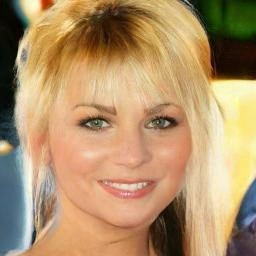

In [ ]:
images = image_pipe()
images[0][0]

In [ ]:
image_pipe # scheduler + model (Unet2DModel)

DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.3.0",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

In [ ]:
from diffusers import DiffusionPipeline #text to image
import transformers

model_id = "CompVis/ldm-text2im-large-256"
ldm = DiffusionPipeline.from_pretrained(model_id)

{'cross_attention_dim'} was not found in config. Values will be initialized to default values.
{'set_alpha_to_one'} was not found in config. Values will be initialized to default values.


In [ ]:
prompt = "A painting of a squirrel eating a burger"
images = ldm([prompt], num_inference_steps=50, eta=0.3, guidance_scale=6)["sample"]


  0%|          | 0/50 [00:00<?, ?it/s]

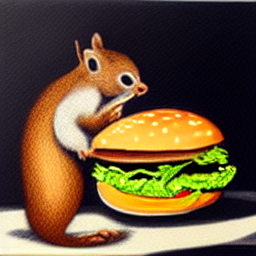

In [ ]:
images[0]

In [ ]:
!huggingface-cli login


        _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
        _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
        _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
        _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
        _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

        To login, `huggingface_hub` now requires a token generated from https://huggingface.co/settings/tokens .
        
Token: 
Login successful
Your token has been saved to /root/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your termin

In [ ]:
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline

model_id = "CompVis/stable-diffusion-v1-4"
device = "cuda"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision="fp16", use_auth_token=True)
pipe = pipe.to(device)

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/1.34k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/71.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

{'trained_betas'} was not found in config. Values will be initialized to default values.


In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
prompt = "A photograph of Batman kissing Robin"
with autocast("cuda"):
    image = pipe(prompt, guidance_scale=7.5).images[0]  
    
image.save("astronaut_rides_horse.png")

  0%|          | 0/51 [00:00<?, ?it/s]

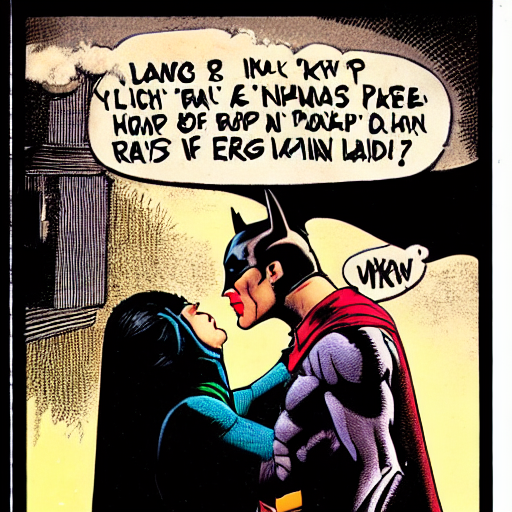

In [ ]:
image

In [ ]:
generator = torch.Generator("cuda").manual_seed(1026)

prompt = ["A photograph of Batman kissing Robin"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

  0%|          | 0/51 [00:00<?, ?it/s]

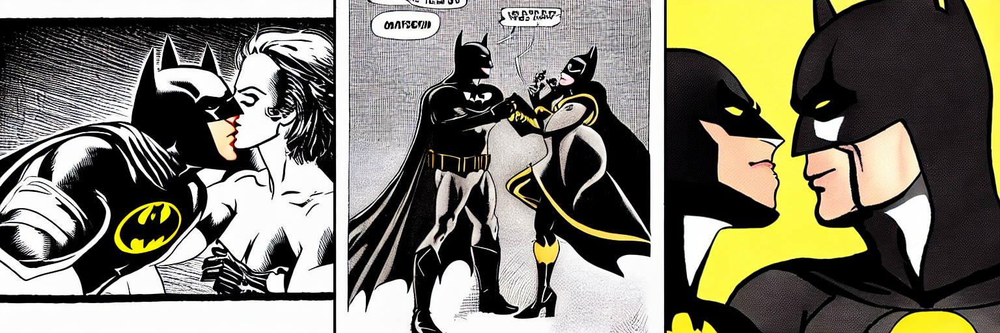

In [ ]:
grid = image_grid(images.images, rows=1, cols=3)
grid

In [ ]:
generator = torch.Generator("cuda").manual_seed(16357)

prompt = ["A photograph of Batman kissing Robin"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, num_inference_steps=80, generator=generator)

  0%|          | 0/85 [00:00<?, ?it/s]

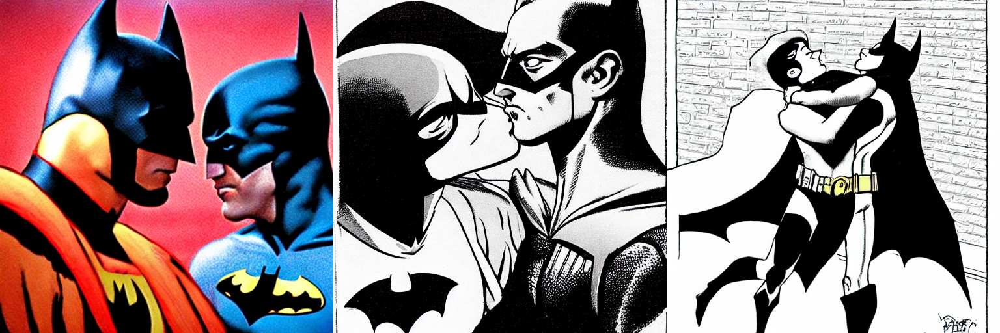

In [ ]:
grid = image_grid(images.images, rows=1, cols=3)
grid

In [ ]:
generator = torch.Generator("cuda").manual_seed(4687)

prompt = ["A photograph of Batman kissing Superman"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, num_inference_steps=80, generator=generator)

  0%|          | 0/85 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


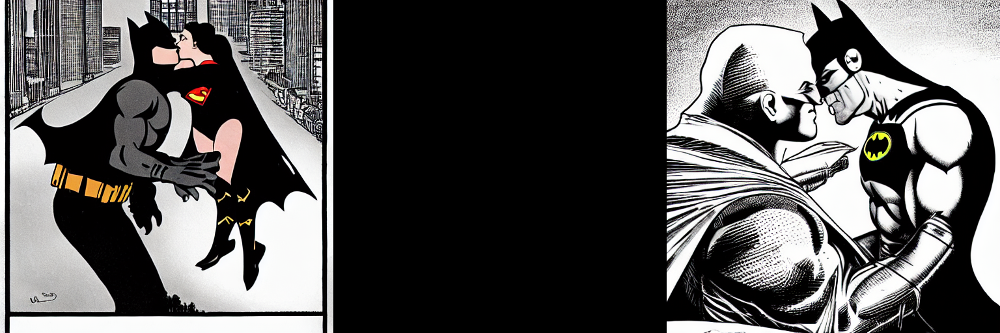

In [ ]:
grid = image_grid(images.images, rows=1, cols=3)
grid

In [ ]:
generator = torch.Generator("cuda").manual_seed(5648)

prompt = ["A photograph of Batman kissing his superhero teammate Robin"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=8.5, num_inference_steps=80, generator=generator)

  0%|          | 0/85 [00:00<?, ?it/s]

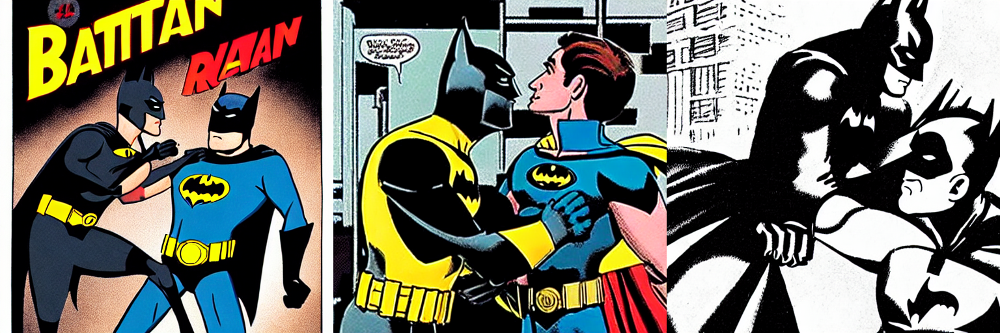

In [ ]:
grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/85 [00:00<?, ?it/s]

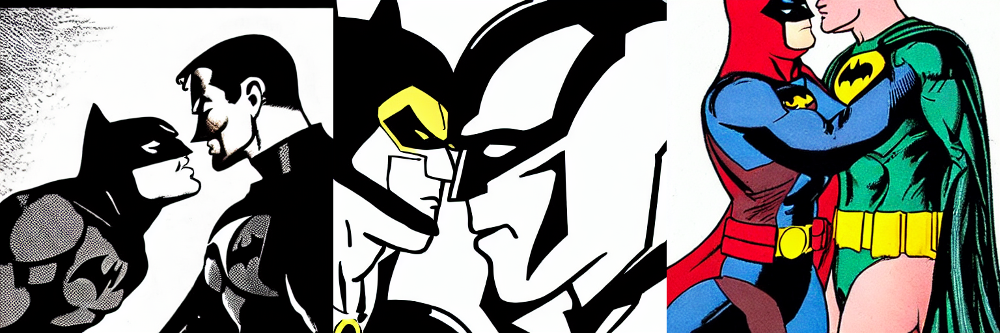

In [ ]:
generator = torch.Generator("cuda").manual_seed(534864)

prompt = ["A photograph of Batman kissing his superhero teammate Robin, style DC Comics"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=6.5, num_inference_steps=80, generator=generator)
  
grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/85 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


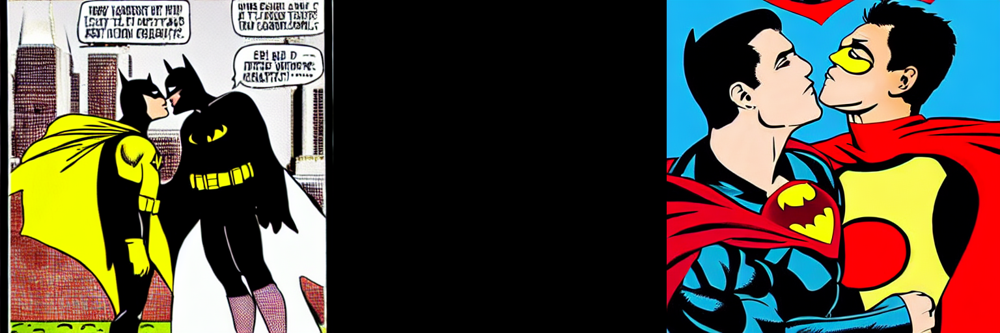

In [ ]:
generator = torch.Generator("cuda").manual_seed(3241867414)

prompt = ["A photograph of Batman kissing his superhero teammate Robin, Superhero style"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=6.5, num_inference_steps=80, generator=generator)
  
grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/85 [00:00<?, ?it/s]

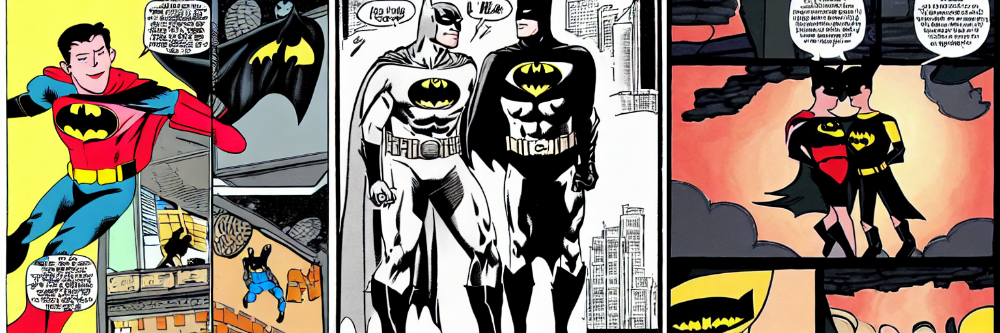

In [ ]:
generator = torch.Generator("cuda").manual_seed(486321)

prompt = ["A photograph of Batman kissing his superhero teammate Robin"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=6.5, num_inference_steps=80, generator=generator)
  
grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


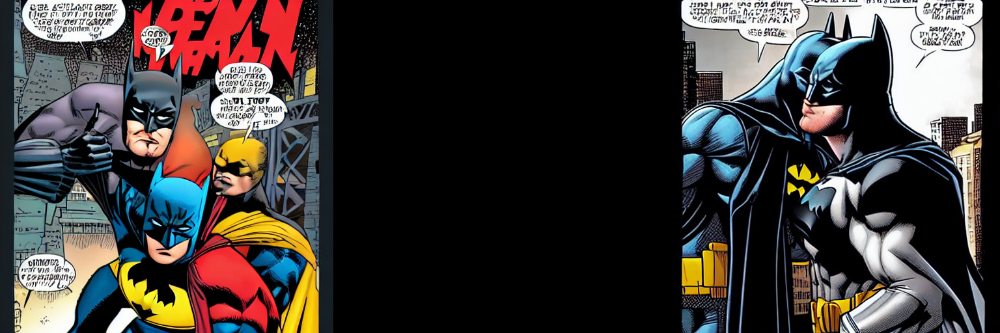

In [ ]:
generator = torch.Generator("cuda").manual_seed(862187)

prompt = ["A photograph of Batman kissing his superhero teammate Robin, Marvel style"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, num_inference_steps=50, generator=generator)
  
grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/41 [00:00<?, ?it/s]

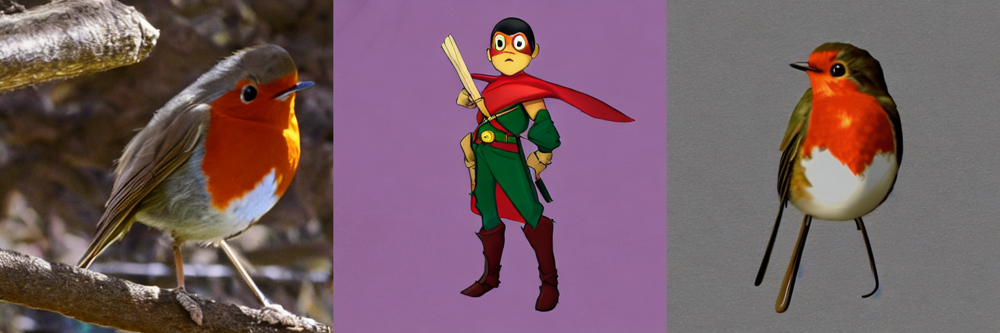

In [ ]:
generator = torch.Generator("cuda").manual_seed(3467)

prompt = ["Robin character"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=8, num_inference_steps=40, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

# Advanced inference pipeline

In [ ]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel
from diffusers import LMSDiscreteScheduler
from torch import autocast

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", use_auth_token=True)

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", use_auth_token=True)

#4 scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

#Transform models to GPU
torch_device = "cuda"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.23.layer_norm2.weight', 'visual_projection.weight', 'vision_model.encoder.layers.2.layer_norm2.bias', 'vision_model.encoder.layers.3.mlp.fc2.weight', 'vision_model.encoder.layers.16.self_attn.out_proj.bias', 'vision_model.encoder.layers.22.self_attn.out_proj.bias', 'vision_model.encoder.layers.18.layer_norm1.bias', 'vision_model.encoder.layers.1.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.self_attn.k_proj.bias', 'vision_model.encoder.layers.16.self_attn.q_proj.bias', 'vision_model.encoder.layers.20.self_attn.out_proj.weight', 'vision_model.encoder.layers.10.layer_norm2.bias', 'vision_model.encoder.layers.4.mlp.fc2.weight', 'vision_model.encoder.layers.6.self_attn.out_proj.bias', 'vision_model.encoder.layers.16.self_attn.k_proj.bias', 'vision_model.encoder.layers.23.layer_norm1.bias', 'vision_model.encoder.layers.16.self_attn.

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0): SpatialTransformer(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (attn1): CrossAttention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_features=320, bias=False)
                (to_out): Sequential(
                

In [ ]:
import torch
prompt = ["A photograph of Batman kissing his teammate Robin, Marvel style"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion

num_inference_steps = 100           # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

generator = torch.manual_seed(0)    # Seed generator to create the inital latent noise

batch_size = len(prompt)


In [ ]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
text_embeddings = torch.cat([text_embeddings, text_embeddings]) # added by me

# max_length = text_input.input_ids.shape[-1]
# uncond_input = tokenizer(
#     [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
# )
# uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
# text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
)
latents = latents.to(torch_device)

scheduler.set_timesteps(num_inference_steps)
latents = latents * scheduler.sigmas[0]

In [ ]:
from tqdm.auto import tqdm
from torch import autocast

scheduler.set_timesteps(num_inference_steps)

with autocast("cuda"):
  for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5)

    # predict the noise residual
    with torch.no_grad():
      noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, i, latents).prev_sample


0it [00:00, ?it/s]

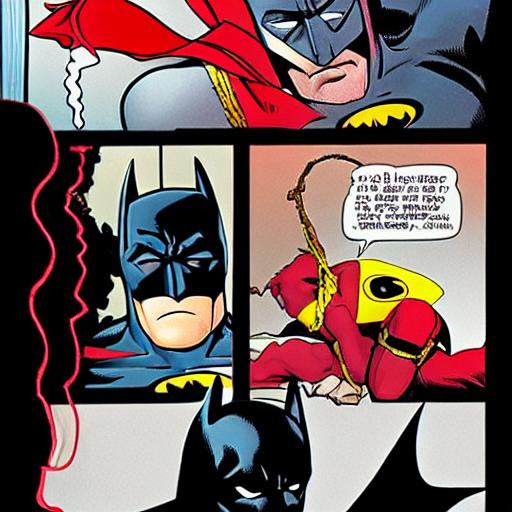

In [ ]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
image = vae.decode(latents).sample

from PIL import Image
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]
